In [1]:
import py2neo
print(py2neo.__version__)

4.0.0b2


In [2]:
# python libraries
from py2neo import Graph
import numpy as np 
from pandas import DataFrame
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import json
import math
import pandas as pd
# import plotly 
# import plotly.graph_objs as go
# import qgrid
from scipy import stats, spatial
from scipy.sparse import csr_matrix
from sklearn.cluster.bicluster import SpectralBiclustering
import scipy.spatial as sp, scipy.cluster.hierarchy as hc, scipy.sparse.csgraph as csgraph
import operator
from IPython.display import display, HTML
from matplotlib.colors import ListedColormap


# connection to Neo4j
local_connection_url = "http://localhost:7474/db/data"
connection_to_graph = Graph(local_connection_url, user="neo4j", password="zxc397") 

# plotly credentials
# plotly_config = json.load(open('plotly_config.json'))
# plotly.tools.set_credentials_file(username=plotly_config['username'], api_key=plotly_config['key'])

In [3]:
f_terms = list(set(DataFrame(connection_to_graph.data('MATCH (a:Asset)-[:CONTAINS]->(fs:Feedstock) RETURN  fs.term, count(a)')).as_matrix()[:, 1]))
o_terms = list(set(DataFrame(connection_to_graph.data('MATCH (a:Asset)-[:CONTAINS]->(fs:Output) RETURN  fs.term, count(a)')).as_matrix()[:, 1]))
pt_terms = list(set(DataFrame(connection_to_graph.data('MATCH (a:Asset)-[:CONTAINS]->(fs:ProcessingTech) RETURN  fs.term, count(a)')).as_matrix()[:, 1]))
bbo = list(f_terms + pt_terms + o_terms)
print ("Number of terms:", len(bbo))
nodes = bbo
print(nodes)

Number of terms: 352
['multi feedstock', 'white pine', 'msw', 'soft white spring wheat', 'wood', 'soy', 'cps wheat', 'triticale', 'animal fats', 'waste vegetable oil', 'corn/barley', 'pine', 'barley straw', 'cheese whey', 'seed oil', 'juniper', 'animal manure', 'bagasse', 'hog fuel', 'steel waste gas (co)', 'Giant reed', 'yard trimmings', 'agricultural residues', 'juncea oil', 'organic waste', 'palm, rapeseed oil, waste fat', 'hardwood', 'cellulosic sugars', 'starch', 'grain', 'garden waste', 'waste water sludge', 'spent sulphite liquor feedstock', 'osb', 'palm', 'poplar/energy woods', 'wheat straw', 'wood chips', 'algae', 'biogenic waste oils', 'mixed cellulose', 'water hyacinth', 'sawdust', 'lumber', 'coniferous wood', 'hogs', 'corn', 'cooking oil', 'barley starch', 'syngas from gasifier', 'macroalgae', 'poppy seed', 'red pine', 'rapeseed oil', 'logging residues', 'distillers grain', 'mixedwood', 'milo', 'eucalyptus', 'fog', 'yeast', 'corn oil', 'grass seed', 'corn stalks', 'sugarcan

C:\Users\agzid\AppData\Local\Continuum\anaconda2\envs\py36\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.
C:\Users\agzid\AppData\Local\Continuum\anaconda2\envs\py36\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\agzid\AppData\Local\Continuum\anaconda2\envs\py36\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [4]:
feedproc = connection_to_graph.data('MATCH p2=(feed:Feedstock)<-[:CONTAINS]-(n:Asset)-[:CONTAINS]->(proc:ProcessingTech) RETURN n.id, n.year, feed.term, proc.term')
feedout = connection_to_graph.data('MATCH p2=(feed:Feedstock)<-[:CONTAINS]-(n:Asset)-[:CONTAINS]->(out:Output) RETURN n.id, n.year, feed.term, out.term')
procout = connection_to_graph.data('MATCH p2=(proc:ProcessingTech)<-[:CONTAINS]-(n:Asset)-[:CONTAINS]->(out:Output) RETURN n.id, n.year, proc.term, out.term')
df1 = pd.DataFrame(feedproc)
df2 = pd.DataFrame(feedout)
df3 = pd.DataFrame(procout)

In [7]:
edgelist = []
for index, row in df1.iterrows():
    rowstr = row[u'feed.term'] + "," + row[u'proc.term']
    #edgelist = edgelist + str
    edgelist.append(rowstr)
# print "df2-------------"
for index, row in df2.iterrows():
    rowstr = row[u'feed.term'] + "," + row[u'out.term']
    edgelist.append(rowstr)
    #edgelist = edgelist + str
# print "df3-------------"
for index, row in df3.iterrows():
    rowstr = row[u'proc.term'] + "," + row[u'out.term']
    edgelist.append(rowstr)
    #edgelist = edgelist + str
edgelist

['cooking oil,solvents',
 'waste,solvents',
 'waste,solvents',
 'industrial waste,solvents',
 'free fatty acid,solvents',
 'corn stover,solvents',
 'stover,solvents',
 'sugar,solvents',
 'corn,solvents',
 'cellulose,solvents',
 'cellulosic biomass,solvents',
 'cellulose,solvents',
 'douglas fir,solvents',
 'wood,solvents',
 'woody biomass,solvents',
 'cellulose,solvents',
 'pine,solvents',
 'wood,solvents',
 'sawdust,solvents',
 'waste water,solvents',
 'algae,solvents',
 'waste,solvents',
 'waste water,solvents',
 'palm,solvents',
 'waste,solvents',
 'sewage,solvents',
 'vegetable oil,solvents',
 'cooking oil,solvents',
 'waste,solvents',
 'waste,solvents',
 'waste water,solvents',
 'algae,solvents',
 'pal waste,solvents',
 'waste,solvents',
 'sewage,solvents',
 'algae,solvents',
 'vegetable oil,solvents',
 'soy,solvents',
 'algae,solvents',
 'cellulose,solvents',
 'cellulosic biomass,solvents',
 'sugar,solvents',
 'cellulose,solvents',
 'hybrid poplar,solvents',
 'poplar,solvents',
 

In [8]:
# convery into weighted edgelist - count occurences for each edge
df = pd.DataFrame({'edges':edgelist}) #convert list to dataframe
df['source'], df['target'] = df['edges'].str.split(',', 1).str
weighted = df.groupby(['edges','source','target']).size().reset_index(name='count')
#weightedless = df.groupby(['edges']).size().reset_index(name='count')
#weightedless

In [9]:
#remove nodes from nodelist that are not in edges
toremove = []
for node in nodes:
    i = 0
    #check if node is in source
    for source in df['source']:
        if node == source:
            i = 1
    #check if node is in source
    for target in df['target']:
        if node == target:
            i = 1
    if i == 0:
        toremove.append(node)
        nodes.remove(node)
print (toremove)
print (len(nodes))

['palm, rapeseed oil, waste fat', 'red pine', 'mixedwood', 'mixed biomass, natural gas', 'radiate pine', 'wood processing residues', 'rice straw, corn stalks', 'corn stover, cobs', 'deciduous forests', 'mixed grass', 'orc process', 'papaya to fatty acids', 'pla from cassava']
339


In [10]:
#nodeindex = {0:'zero',1:'one'}
#create dictionary to map indexes to nodes
nodeindex = {}
for i in range(len(nodes)):
    nodeindex[i] = nodes[i]
nodeindex

{0: 'multi feedstock',
 1: 'white pine',
 2: 'msw',
 3: 'soft white spring wheat',
 4: 'wood',
 5: 'soy',
 6: 'cps wheat',
 7: 'triticale',
 8: 'animal fats',
 9: 'waste vegetable oil',
 10: 'corn/barley',
 11: 'pine',
 12: 'barley straw',
 13: 'cheese whey',
 14: 'seed oil',
 15: 'juniper',
 16: 'animal manure',
 17: 'bagasse',
 18: 'hog fuel',
 19: 'steel waste gas (co)',
 20: 'Giant reed',
 21: 'yard trimmings',
 22: 'agricultural residues',
 23: 'juncea oil',
 24: 'organic waste',
 25: 'hardwood',
 26: 'cellulosic sugars',
 27: 'starch',
 28: 'grain',
 29: 'garden waste',
 30: 'waste water sludge',
 31: 'spent sulphite liquor feedstock',
 32: 'osb',
 33: 'palm',
 34: 'poplar/energy woods',
 35: 'wheat straw',
 36: 'wood chips',
 37: 'algae',
 38: 'biogenic waste oils',
 39: 'mixed cellulose',
 40: 'water hyacinth',
 41: 'sawdust',
 42: 'lumber',
 43: 'coniferous wood',
 44: 'hogs',
 45: 'corn',
 46: 'cooking oil',
 47: 'barley starch',
 48: 'syngas from gasifier',
 49: 'macroalgae'

In [13]:
# create matrix with zeros with size nodes x nodes
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
zero_data = np.zeros(shape=(len(nodes),len(nodes)))
adjacency = pd.DataFrame(zero_data, index = nodeindex, columns=nodes)
adjacency.rename(index=nodeindex, inplace=True)
#d.rename(nodes, axis='index')
#dists.at[' aerobic digestion',' aerobic digestion'] = 1

In [16]:
#fill adjacency matrix with actual distances, i.e. edge weights
#for each row in edgelist df 
    #put count into source/target cell in distmatrix / d.at[nodes.index(source),target] = count
for index, row in weighted.iterrows():
    #if nodes.isin(row.source) and nodes.isin(row.target) :
    #print row['count']
    if row.source in nodes and row.target in nodes:
        adjacency.at[row.source,row.target] = row['count']
        adjacency.at[row.target,row.source] = row['count']
    else:
        print (row.source + ":" + row.target)
%store adjacency
%store nodes

corn stover: cobs,cellulosic biofuel
corn stover: cobs,cellulosic ethanol
corn stover: cobs,enzymatic hydrolysis
corn stover: cobs,ethanol
corn stover: cobs,hydrolysis
methanol synthesis: mtg catalysis,ethanol
methanol synthesis: mtg catalysis,gasoline
methanol synthesis: mtg catalysis,methanol
methanol synthesis: mtg catalysis,renewable gasoline
mixed biomass: natural gas,catalysis
mixed biomass: natural gas,ethanol
mixed biomass: natural gas,gasoline
mixed biomass: natural gas,methanol
mixed biomass: natural gas,methanol synthesis, mtg catalysis
mixed biomass: natural gas,renewable gasoline
palm: rapeseed oil, waste fat,advanced biofuel
palm: rapeseed oil, waste fat,drop-in fuels
palm: rapeseed oil, waste fat,hydroprocessing
palm: rapeseed oil, waste fat,renewable diesel
rice straw: corn stalks, anaerobic digestion
rice straw: corn stalks,biobutanol
rice straw: corn stalks,biogas
rice straw: corn stalks,butanol
rice straw: corn stalks,fermentation
rice straw: corn stalks,hydrolysis
S

In [57]:
import networkx as nx
from matplotlib import pyplot, patches

def draw_adjacency_matrix(G, node_order=None, partitions=[], colors=[]):
    """
    - G is a netorkx graph
    - node_order (optional) is a list of nodes, where each node in G
          appears exactly once
    - partitions is a list of node lists, where each node in G appears
          in exactly one node list
    - colors is a list of strings indicating what color each
          partition should be
    If partitions is specified, the same number of colors needs to be
    specified.
    """
    adjacency_matrix = nx.to_numpy_matrix(G, dtype=np.bool, nodelist=node_order)

    #Plot adjacency matrix in toned-down black and white
    fig = pyplot.figure(figsize=(5, 5)) # in inches
    pyplot.imshow(adjacency_matrix,
                  cmap="Greys",
                  interpolation="none")
    
    # The rest is just if you have sorted nodes by a partition and want to
    # highlight the module boundaries
    assert len(partitions) == len(colors)
    ax = pyplot.gca()
    for partition, color in zip(partitions, colors):
        current_idx = 0
        for module in partition:
            ax.add_patch(patches.Rectangle((current_idx, current_idx),
                                          len(module), # Width
                                          len(module), # Height
                                          facecolor="none",
                                          edgecolor=color,
                                          linewidth="1"))
            current_idx += len(module)

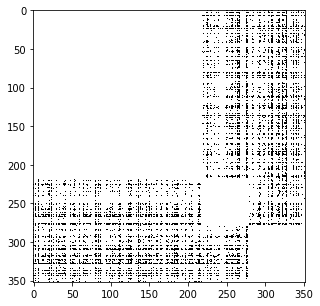

In [58]:
from scipy import io

#A = io.mmread("Caltech.mtx")
G = nx.from_scipy_sparse_matrix(csr_matrix(dists.values))
draw_adjacency_matrix(G)

In [59]:
len(f_terms)

217

In [60]:
len(pt_terms)

61

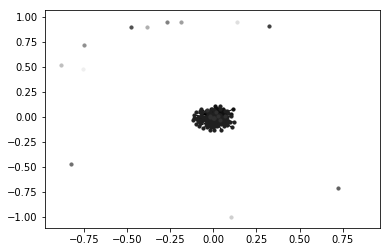

In [72]:
import community
import networkx as nx
import matplotlib.pyplot as plt

#first compute the best partition
partition = community.best_partition(G, resolution=10)

#drawing
size = float(len(set(partition.values())))
pos = nx.spring_layout(G)
count = 0.
for com in set(partition.values()) :
    count = count + 1.
    list_nodes = [nodes for nodes in partition.keys()
                                if partition[nodes] == com]
    nx.draw_networkx_nodes(G, pos, list_nodes, node_size = 10,
                                node_color = str(count / size))


nx.draw_networkx_edges(G, pos, alpha=1.0)
plt.show()

In [70]:
partition

{0: 0,
 1: 1,
 2: 2,
 3: 3,
 4: 4,
 5: 5,
 6: 6,
 7: 7,
 8: 8,
 9: 9,
 10: 10,
 11: 11,
 12: 12,
 13: 13,
 14: 14,
 15: 15,
 16: 16,
 17: 17,
 18: 18,
 19: 19,
 20: 20,
 21: 21,
 22: 10,
 23: 22,
 24: 23,
 25: 24,
 26: 25,
 27: 10,
 28: 26,
 29: 5,
 30: 27,
 31: 6,
 32: 18,
 33: 6,
 34: 28,
 35: 28,
 36: 14,
 37: 6,
 38: 29,
 39: 30,
 40: 31,
 41: 32,
 42: 18,
 43: 1,
 44: 33,
 45: 34,
 46: 35,
 47: 36,
 48: 37,
 49: 38,
 50: 39,
 51: 6,
 52: 12,
 53: 40,
 54: 41,
 55: 42,
 56: 3,
 57: 43,
 58: 39,
 59: 44,
 60: 45,
 61: 1,
 62: 25,
 63: 18,
 64: 10,
 65: 46,
 66: 47,
 67: 6,
 68: 34,
 69: 48,
 70: 49,
 71: 30,
 72: 5,
 73: 43,
 74: 50,
 75: 24,
 76: 51,
 77: 25,
 78: 1,
 79: 3,
 80: 52,
 81: 53,
 82: 54,
 83: 55,
 84: 56,
 85: 57,
 86: 58,
 87: 59,
 88: 60,
 89: 10,
 90: 3,
 91: 61,
 92: 20,
 93: 5,
 94: 62,
 95: 63,
 96: 64,
 97: 65,
 98: 47,
 99: 6,
 100: 30,
 101: 23,
 102: 66,
 103: 67,
 104: 68,
 105: 69,
 106: 48,
 107: 70,
 108: 71,
 109: 42,
 110: 65,
 111: 72,
 112: 5,
 113: 

In [175]:
#convert dense to sparse
sparse = csgraph.csgraph_from_dense(dists.values)
sparse

<339x339 sparse matrix of type '<type 'numpy.float64'>'
	with 10894 stored elements in Compressed Sparse Row format>

In [177]:
#convert adjacency matrix into distance matrix
#distmatrix = csgraph.shortest_path(dists.values, directed=False,unweighted=False)
distmatrix = csgraph.shortest_path(sparse, directed=False,unweighted=False)
dfm = pd.DataFrame(distmatrix, columns = nodes)
dfm.rename(index=nodeindex, inplace=True)
dfm

,vegetable oil,recycled ethanol,woodwaste/bagasse,natural gas,various grasses,nonedible oils,animal fats,paper,ponderosa pine,grass seed,sulfite spent liquor from spruce wood pulping,osb,paper waste,corn cob,energy grasses,logging residues,willow,crop waste,firewood,jatropha,sugarcane bagasse,sugar,durum,wood,municipal solid waste,banna grass,waste oil,cassava pulp,barley,mixed oilseeds,starch,white grease,coniferous wood,corn oil,wood waste,mixed cellulose,corn stalks,yellow grease,molasses,woodchips,food waste,citrus residues,wood chips,spent sulphite liquor feedstock,cotton residue,industrial waste,corn stover,cereals/sugar,waste fat,waste vegetable oil,tallow,sewage,white pine,hardwood,biogas from municipal wastewater treatment facility digesters,loblolly pine,stump material,miscanthus,palm,milo,animal residue,bark,fall rye,agriculture,textiles,beef tallow,animal waste,cobs,forest residues,grass clippings,fat products,plywood,dry biomass,southern yellow pine,free fatty acid,trap grease,woody and agricultural by-products,syngas from gasifier,cellulose,wheat,organic waste,oil plants,corn,animal manure,dung,agricultural waste,elephant grass,soft white spring wheat,biogas from landfills,waste water sludge,poppy seed,algae,rice straw,barley straw,Giant reed,rice hulls,canola oil,msw,digester gas,seeds,grain,distillers grain,sugar beet,mixed biomass,brewery waste,triticale,camelina,cellulosic biomass,multi feedstock,plastics,palm stearin,poultry fat,straw,water hyacinth,hogs,beverage waste,macroalgae,sugar base,soy,woody biomass,maple,bagasse,wheat straw,jathropa,medium density fiberboard,biodegradable waste,corn sugar,poplar/energy woods,husk,fog,feed wheat,waste,soy oil,oilseeds,pal waste,grass straw and corn stalks,agricultural biomass,glycerin,used cooking oil,hydrous ethanol,seed oil,manure,shrub willow,juncea oil,grains,syngas,barley starch,particle board,energy crops,slash pine,lemna,lumber,hog fuel,Decommissioned electricity poles and railway ties,agricultural residues,grass,sorghum,virgin oil,cps wheat,rapeseed oil,cooking oil,sawdust,sugarcane trash,cheese whey,corn/barley,switchgrass,yard trimmings,stover,biogenic waste oils,douglas fir,bagasse/cane trash,crude glycerine,brown grease,waste water,garden waste,yeast,oak,pine,natural fats,forestry,wood fuel,steel waste gas (co),mixed prairie grass,whey,lignocellulosics,cellulosic sugars,juniper,sugarcane,urban wood,flaxseed oil,residues,cotton gin trash,rapeseed,arundo donax,dedicated energy crops,black liquor,eucalyptus,corn/milo,beets,non-food grade canola oil,non-cellulosic portions of sfw,refined vegetable oil,vegetable waste,poplar,palm oil,blend,hybrid poplar,hydrochloric acid,algae transesterification,aerobic digestion,consolidated bioprocessing,methane recovery,hydroprocessing,solar conversion,biomass combustion,gasification,enzymatic hydrolysis,biogas productions,chemprocessing,oil extraction,bioenergy generation,coking,charring,cbp,microwave,btl - syngas,bioforming,algal oil extraction,"methanol synthesis, mtg catalysis",biomass gasification,black liquor gasification,grate furnaces,algae burning/transesterifcation,solvents,fixed bed gasifiers,biochemical conversions,blg,alcoholic fermentation,steam reform/ft,fischer-tropsch,hydrotreating,transesterification,algae oil extraction,gas cleaning,landfill gas,pyrolysis oil,thermochemical conversions,fast pyrolysis,scrubbers,tbd,plant cell culture,acid hydrolysis,advanced fermentation,pyrolysis,liquefaction,gasification-fermentation,hydrolysis,algae oil hydrotreating,ft microchannel reactor,pressing,metathesis,algae fermentation,fluidized bed furnaces,anaerobic digestion,ti gasification,fermentation,catalysis,renewable liquefied natural gas,furanics,biodme,chems,cellulosic heating oil,"chems, fibers",succinic acid,renewable jet fuel,"succinic acid, polylutylene succinate",ethanol blending,succinic acid/ bdo,adipic acid,renewable chemicals,cellulosic naphtha,syng,drop-in fuels,electricity from biomass,renewable heating

In [172]:
dfm.to_csv('distances.csv', sep=';')

In [180]:
db = DBSCAN(eps=10, min_samples=2, metric = "precomputed").fit(distmatrix)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

1

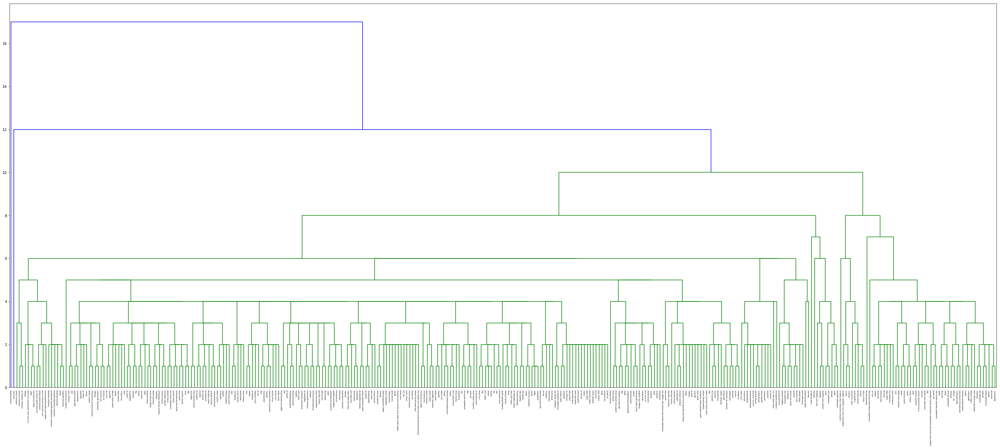

In [181]:
linkage = hc.linkage(sp.distance.squareform(dfm), method='complete')
from scipy.cluster.hierarchy import dendrogram
fig = plt.figure()
b = dendrogram(linkage, labels = nodes)
fig.set_size_inches(50, 20)
fig.savefig('test2png.png', dpi=100)
#sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)
#a = sns.clustermap(distmatrix,  figsize=(100, 100), square=False)

In [186]:
rootnode, cnodelist = hc.to_tree(linkage, rd=True)
len(cnodelist)

677

In [192]:
for row in linkage:
    print row

[  0. 229.   1.   2.]
[  2. 291.   1.   2.]
[ 15. 330.   1.   2.]
[ 14. 265.   1.   2.]
[ 16. 207.   1.   2.]
[ 20. 219.   1.   2.]
[ 28. 210.   1.   2.]
[ 42. 239.   1.   2.]
[ 49. 212.   1.   2.]
[ 51. 220.   1.   2.]
[ 53. 250.   1.   2.]
[ 55. 233.   1.   2.]
[ 66. 256.   1.   2.]
[ 83. 209.   1.   2.]
[ 98. 244.   1.   2.]
[106. 247.   1.   2.]
[110. 309.   1.   2.]
[111. 245.   1.   2.]
[ 40. 214.   1.   2.]
[ 48. 240.   1.   2.]
[ 59. 296.   1.   2.]
[ 68. 217.   1.   2.]
[ 79. 221.   1.   2.]
[ 92. 312.   1.   2.]
[ 94. 216.   1.   2.]
[ 99. 222.   1.   2.]
[112. 274.   1.   2.]
[116. 259.   1.   2.]
[128. 223.   1.   2.]
[129. 253.   1.   2.]
[133. 243.   1.   2.]
[136. 304.   1.   2.]
[139. 241.   1.   2.]
[141. 248.   1.   2.]
[144. 215.   1.   2.]
[145. 230.   1.   2.]
[150. 282.   1.   2.]
[168. 284.   1.   2.]
[172. 279.   1.   2.]
[180. 254.   1.   2.]
[206. 266.   1.   2.]
[ 21. 227.   1.   2.]
[119. 281.   1.   2.]
[  7. 211.   1.   2.]
[ 24. 249.   1.   2.]
[ 37. 252.

In [190]:
np.savetxt("clusters.csv", linkage, delimiter=";")